### Importing the Libraries 

In [75]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt  
import seaborn as sns 
import tensorflow as tf 
import keras 
from keras.preprocessing.image import ImageDataGenerator
import os
import pathlib
import cv2

### Displaying  up the Path of the images 

In [76]:

def show_rand(x,dir='data/Fruit_category/apple'):
    if len(x)==30:
        f,ax=plt.subplots(6,5,figsize=(40,40))
        for i,file_name in enumerate(x):
            img=cv2.imread(os.path.join(dir,file_name))
            img=cv2.resize(img,(100,100))
            img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
            ax[i//5][i%5].imshow(img,aspect='auto')
            ax[i//5][i%5].set_xticks([]); ax[i//5][i%5].set_yticks([])
            
        plt.show()

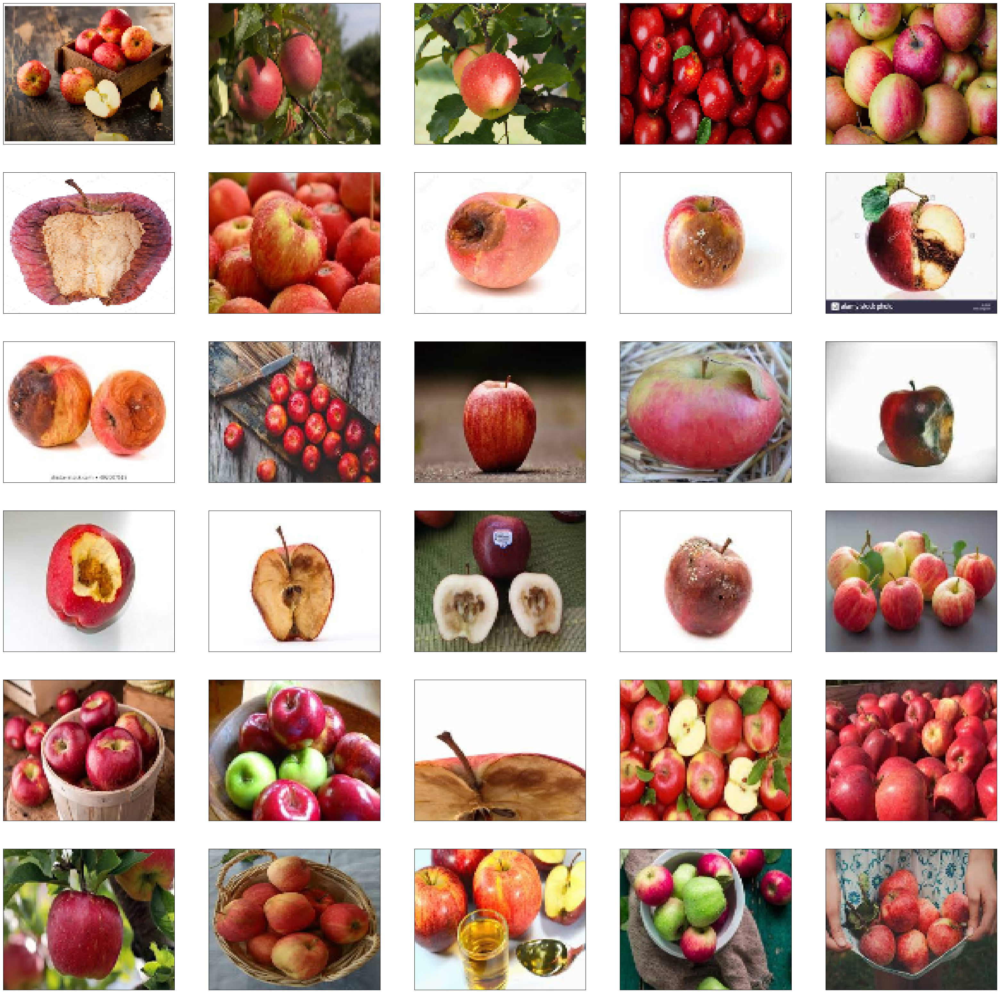

In [77]:
show_rand(os.listdir('data/Fruit_category/apple')[:30],dir='data/Fruit_category/apple')

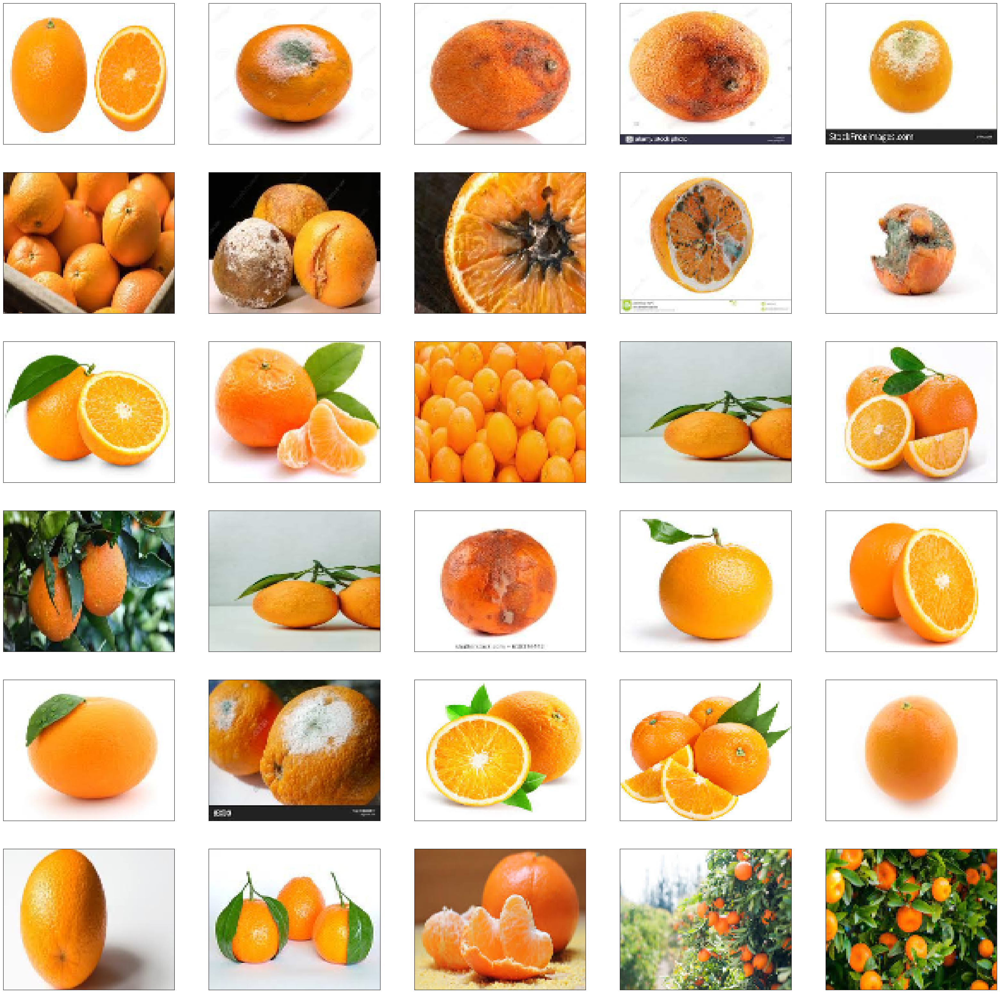

In [78]:
show_rand(os.listdir('data/Fruit_category/orange')[:30],dir='data/Fruit_category/orange')

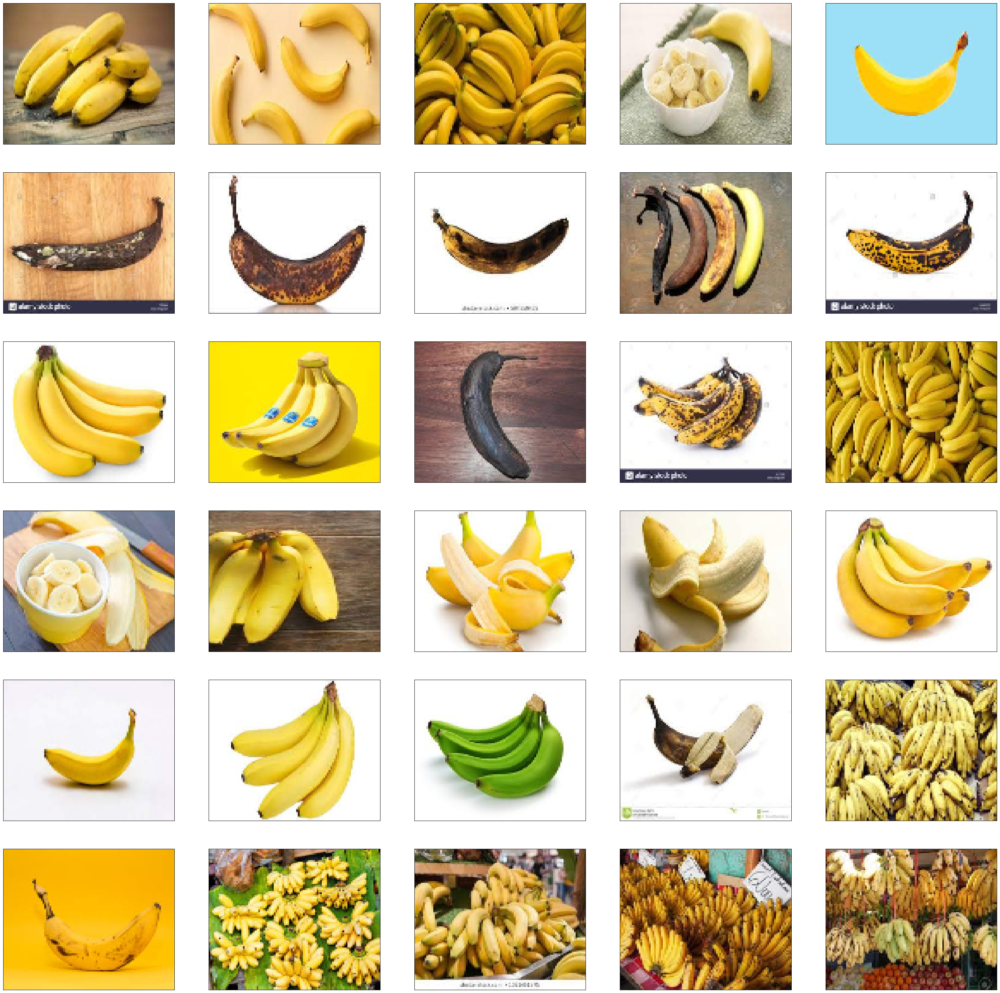

In [79]:
show_rand(os.listdir('data/Fruit_category/banana')[:30],dir='data/Fruit_category/banana')

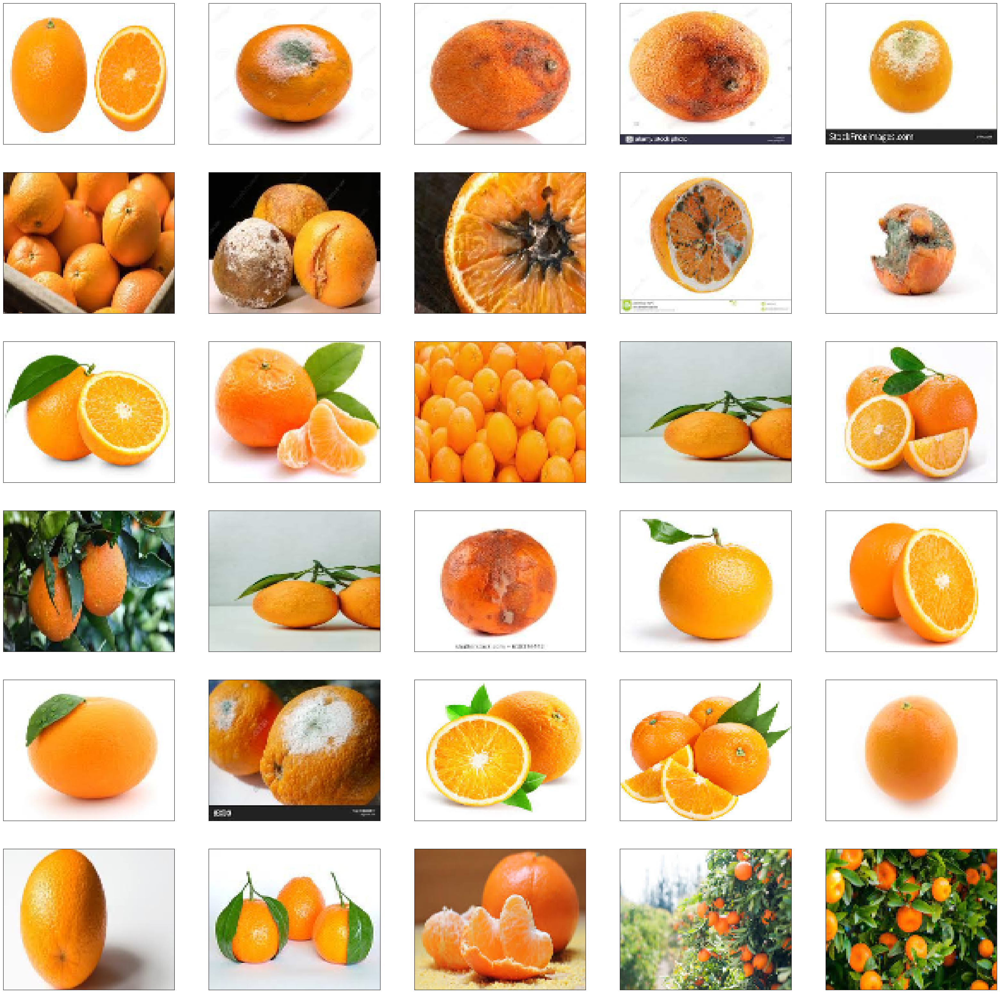

In [80]:
show_rand(os.listdir('data/Fruit_category/orange')[:30],dir='data/Fruit_category/orange')

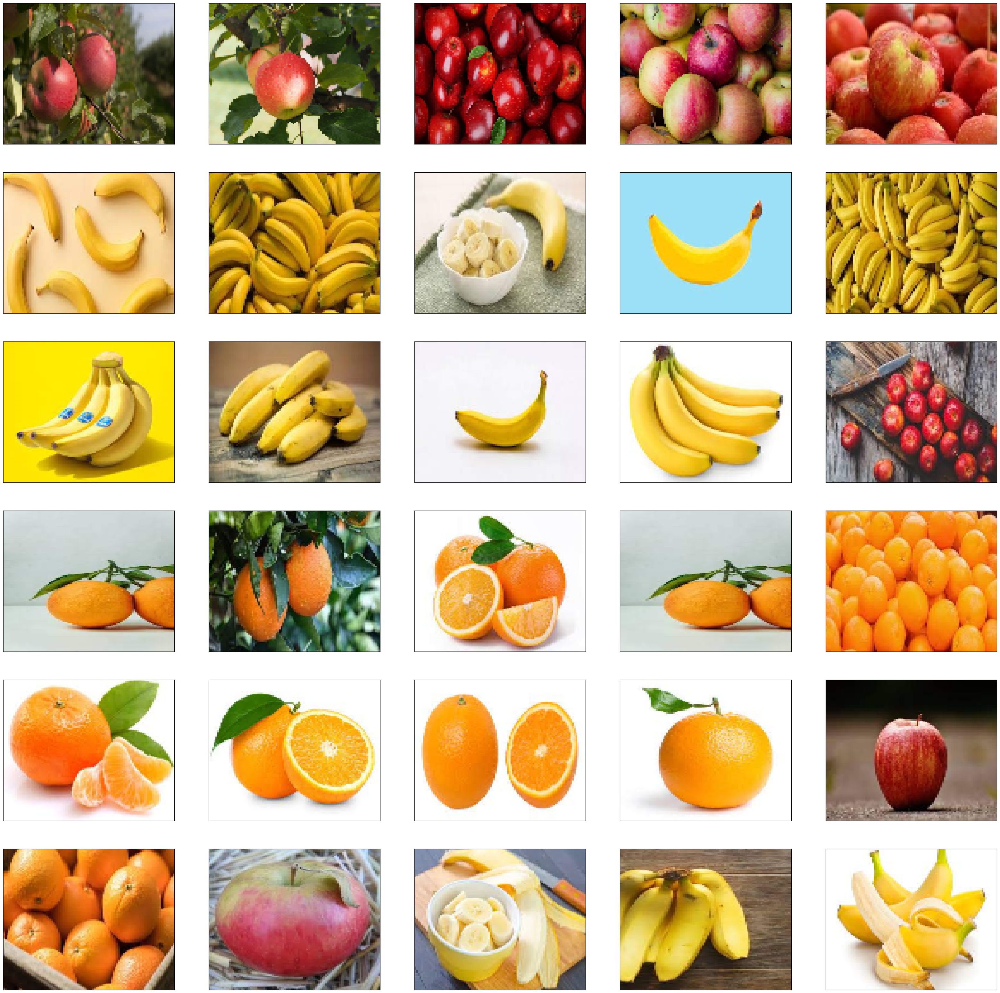

In [81]:
show_rand(os.listdir('data/quality/fresh')[:30],dir='data/quality/fresh')

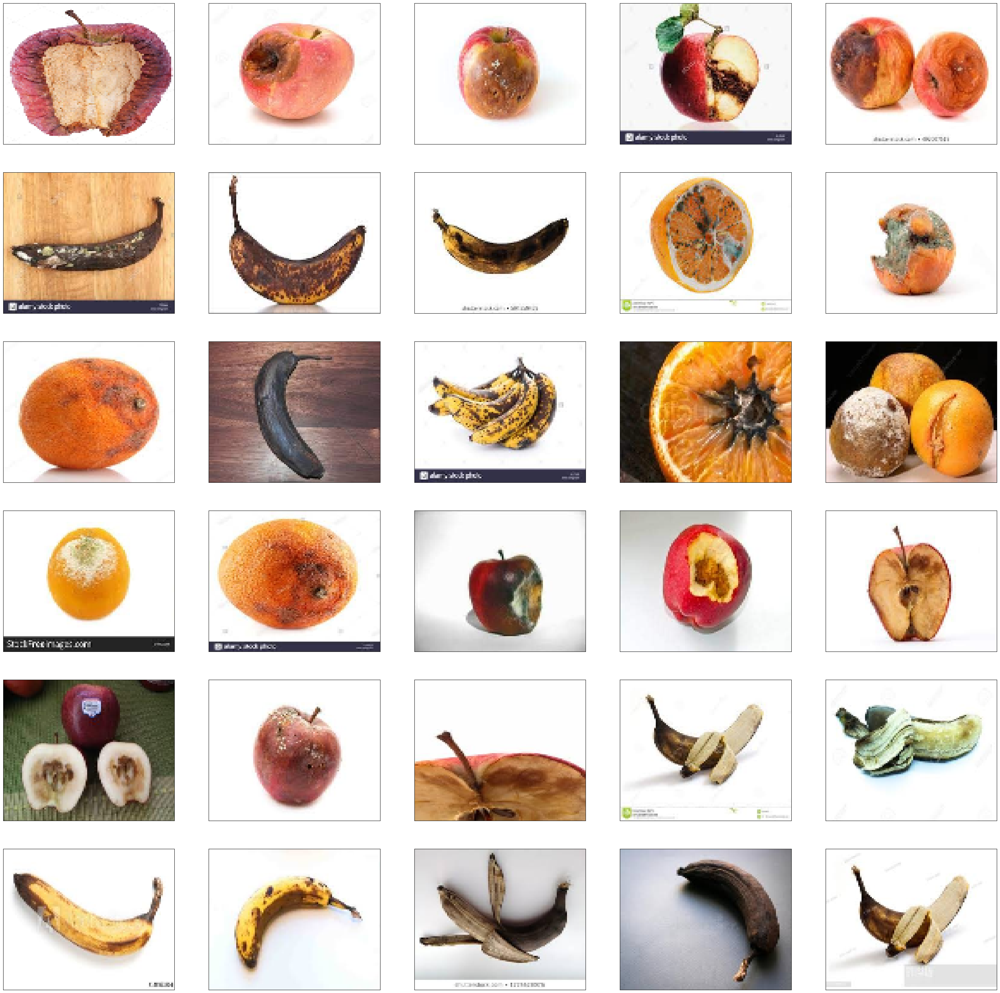

In [82]:
show_rand(os.listdir('data/quality/rotten')[:30],dir='data/quality/rotten')

In [83]:
import keras 
from keras.models import Sequential 
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense,Conv2D,MaxPooling2D,Flatten,Dropout 

# Defining the ImageDataGenerator with augmentation parameters
datagen = ImageDataGenerator(
    rotation_range=20,  # Rotate the image by a random angle within the range of [-20, 20] degrees
    width_shift_range=0.2,  # Shift the image horizontally by a random fraction within the range of [-0.2, 0.2]
    height_shift_range=0.2,  # Shift the image vertically by a random fraction within the range of [-0.2, 0.2]
    shear_range=0.2,  # Apply shear transformation to the image by a random angle within the range of [-0.2, 0.2] degrees
    zoom_range=1.255,  # Zooming the image by a random factor within the range of [0.8, 1.2]
    horizontal_flip=True,  # Flipping the image horizontally
    vertical_flip=True,  # Flipping the image vertically
    validation_split=0.18  # Splitting the data into training and validation sets
)

train_generator_fruit = datagen.flow_from_directory(
    'data/Fruit_category',
    target_size=(100, 100),
    batch_size=20,
    class_mode='categorical',
    subset='training',
    shuffle=True  # Shuffling the data to avoid shape errors
)
validation_generator_fruit = datagen.flow_from_directory(
    'data/Fruit_category',
    target_size=(100, 100),
    batch_size=20,
    class_mode='categorical',
    subset='validation',
    shuffle=True  # Shuffling the data to avoid shape errors
)
train_generator_quality = datagen.flow_from_directory(
    'data/quality',
    target_size=(100, 100),
    batch_size=20,
    class_mode='binary',
    subset='training',
    shuffle=True,  # Shuffling the data to avoid shape errors
    classes={'Rotten':1,'fresh':0})

)
validation_generator_quality = datagen.flow_from_directory(
    'data/quality',
    target_size=(100, 100),
    batch_size=20,
    class_mode='binary',
    shuffle=True,  # Shuffling the data to avoid shape errors
    classes={'Rotten':1,'fresh':0})
)


Found 358 images belonging to 3 classes.
Found 77 images belonging to 3 classes.
Found 332 images belonging to 2 classes.
Found 403 images belonging to 2 classes.


In [ ]:
from keras.models import Sequential
from keras.layers import Dense, Conv2D, MaxPooling2D, Flatten

model = Sequential()
model.add(Conv2D(32, (3,3), activation='relu',input_shape=(100, 100, 3)))
model.add(MaxPooling2D((2,2)))
model.add(Conv2D(64, (3,3),activation='relu'))
model.add(MaxPooling2D((2,2)))
model.add(Conv2D(128, (3,3),activation='relu'))
model.add(MaxPooling2D((2,2)))
model.add(Flatten())
model.add(Dense(128, activation='relu'))
model.add(Dense(3, activation='softmax'))

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history1=model.fit(train_generator_fruit,validation_data=validation_generator_fruit,epochs=10)





In [84]:
train_generator_fruit.class_indices

{'apple': 0, 'banana': 1, 'orange': 2}

In [85]:
train_generator_quality.class_indices

{'Rotten': 0, 'fresh': 1}

In [104]:

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten

# Define the architecture of the model
model1 = Sequential()
model1.add(Conv2D(32, (3,3), activation='relu',input_shape=(100, 100, 3)))
model1.add(MaxPooling2D((2,2)))
model1.add(Conv2D(64, (3,3),activation='relu'))
model1.add(MaxPooling2D((2,2)))
model1.add(Conv2D(128, (3,3),activation='relu'))
model1.add(MaxPooling2D((2,2)))
model1.add(Flatten())
model1.add(Dense(128, activation='relu'))
model1.add(Dense(3, activation='softmax'))

model1.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

history2=model.fit(train_generator_fruit,steps_per_epoch=len(train_generator_fruit),
          validation_data=validation_generator_fruit, validation_steps=len(validation_generator_fruit),
          epochs=100)

loss, accuracy = model.evaluate(validation_generator_fruit, steps=len(validation_generator_fruit))
print('Validation Loss:', loss)
print('Validation Accuracy:', accuracy)
model1.save('model.h5')


Epoch 1/100
18/18 [==============================] - 2s 130ms/step - loss: 0.4204 - accuracy: 0.8547 - val_loss: 0.2959 - val_accuracy: 0.8831
Epoch 2/100
18/18 [==============================] - 2s 122ms/step - loss: 0.4253 - accuracy: 0.8464 - val_loss: 0.3769 - val_accuracy: 0.8701
Epoch 3/100
18/18 [==============================] - 2s 124ms/step - loss: 0.3871 - accuracy: 0.8603 - val_loss: 0.3195 - val_accuracy: 0.8701
Epoch 4/100
18/18 [==============================] - 2s 121ms/step - loss: 0.4031 - accuracy: 0.8547 - val_loss: 0.2816 - val_accuracy: 0.8961
Epoch 5/100
18/18 [==============================] - 2s 122ms/step - loss: 0.4833 - accuracy: 0.8268 - val_loss: 0.2352 - val_accuracy: 0.8961
Epoch 6/100
18/18 [==============================] - 2s 128ms/step - loss: 0.4987 - accuracy: 0.8436 - val_loss: 0.3334 - val_accuracy: 0.8961
Epoch 7/100
18/18 [==============================] - 2s 124ms/step - loss: 0.3900 - accuracy: 0.8492 - val_loss: 0.2513 - val_accuracy: 0.8831

c:\Users\ABHIRAM NAIDU\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [89]:
train_generator_fruit.class_indices

{'apple': 0, 'banana': 1, 'orange': 2}

In [90]:
train_generator_quality.class_indices

{'Rotten': 0, 'fresh': 1}

In [91]:
train_generator_fruit.classes 

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,

In [92]:
train_generator_quality.classes

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,

In [93]:
rotten_model=tf.keras.models.load_model('model2.h5')
fruit_model=tf.keras.models.load_model('model.h5')

In [94]:
rotten_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 3, 3, 512)         14714688  
                                                                 
 flatten_6 (Flatten)         (None, 4608)              0         
                                                                 
 dense_12 (Dense)            (None, 128)               589952    
                                                                 
 dense_13 (Dense)            (None, 1)                 129       
                                                                 
Total params: 15304769 (58.38 MB)
Trainable params: 590081 (2.25 MB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


In [ ]:
fruit_model.summary()

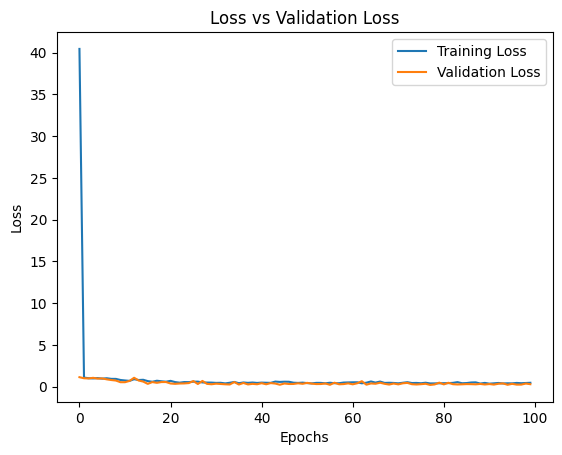

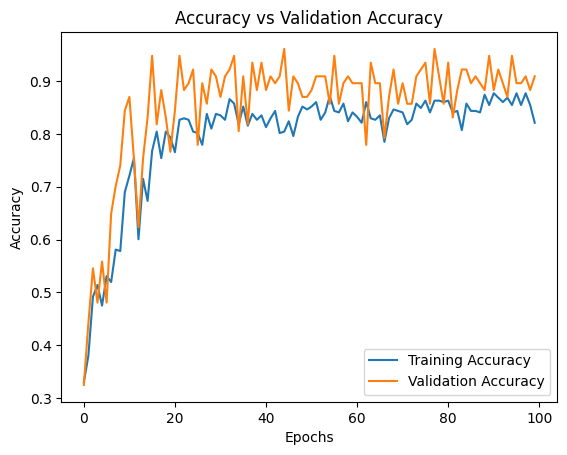

In [95]:
import matplotlib.pyplot as plt

# Plot loss vs val_loss
plt.plot(history1.history['loss'],label='Training Loss')
plt.plot(history1.history['val_loss'],label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss vs Validation Loss')
plt.legend()
plt.show()


plt.plot(history1.history['accuracy'],label='Training Accuracy')
plt.plot(history1.history['val_accuracy'],label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Validation Accuracy')
plt.legend()
plt.show()


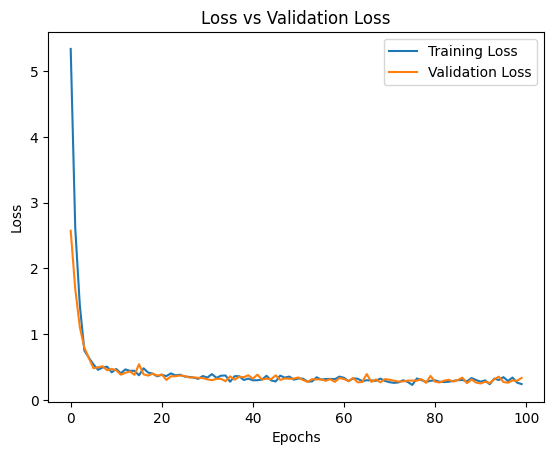

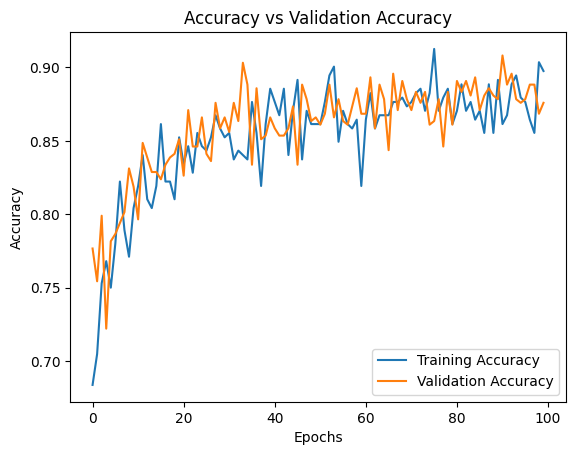

In [96]:
import matplotlib.pyplot as plt

# Plot loss vs val_loss
plt.plot(history2.history['loss'],label='Training Loss')
plt.plot(history2.history['val_loss'],label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss vs Validation Loss')
plt.legend()
plt.show()


plt.plot(history2.history['accuracy'],label='Training Accuracy')
plt.plot(history2.history['val_accuracy'],label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Validation Accuracy')
plt.legend()
plt.show()

In [97]:
def show_rand_pred(x, dir_='fresh', model=None, model_2=None):
    if len(x) == 30:
        f, ax = plt.subplots(6, 5, figsize=(40, 40))
        for i, file_name in enumerate(x):
            img = cv2.imread(os.path.join(dir_, file_name))
            img = cv2.resize(img, (100, 100))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            fruit_pred = np.argmax(model.predict(np.expand_dims(img, axis=0)))
            quality_pred = np.argmax(model_2.predict(np.expand_dims(img, axis=0)))
            ax[i // 5][i % 5].set_title('Fruit:{}, quality:{}'.format(fruit_pred, quality_pred))
            ax[i // 5][i % 5].imshow(img, aspect='auto')
            ax[i // 5][i % 5].set_xticks([])
            ax[i // 5][i % 5].set_yticks([])
        plt.show()


### Encoded Variables
### Fresh:1 , Rotten:0
### Apple: 0, Orange: 1, Banana: 2

1/1 [==============================] - 0s 75ms/step


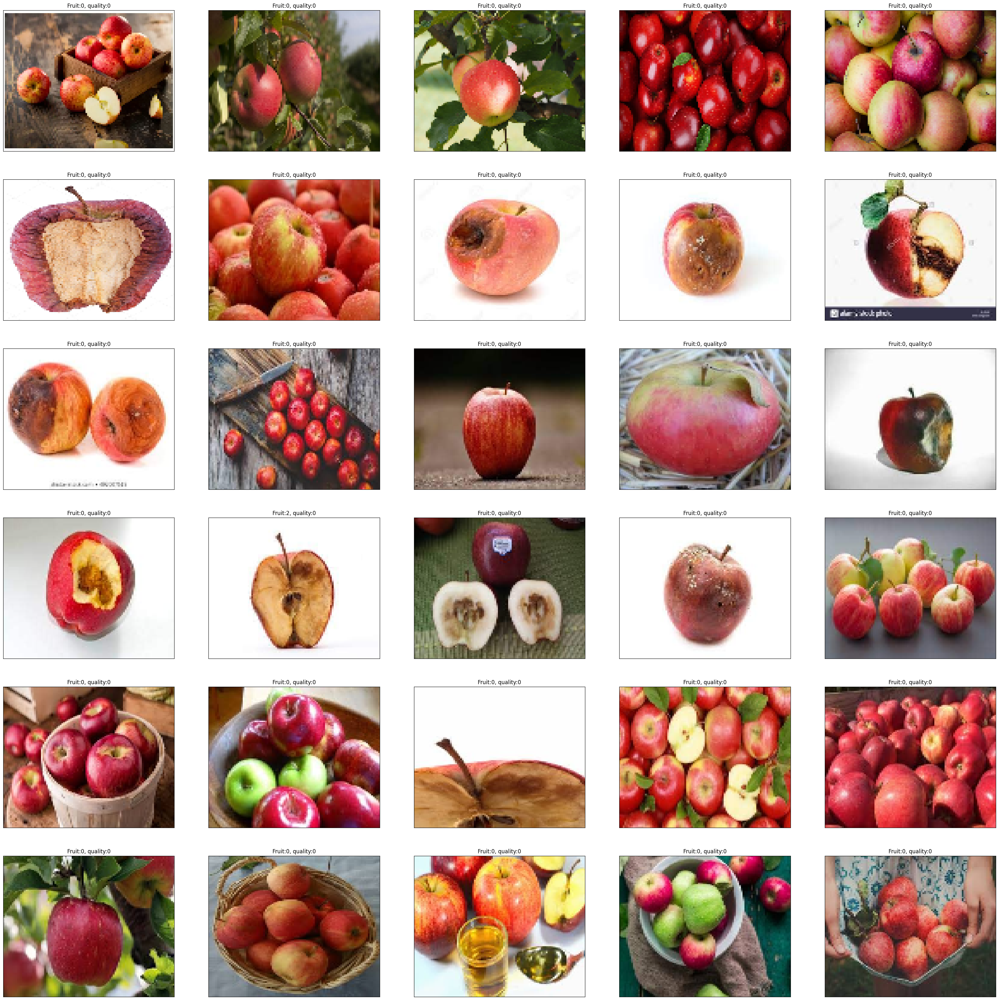

In [98]:
show_rand_pred(os.listdir('data/Fruit_category/apple')[:30],dir_='data/Fruit_category/apple', model=fruit_model, model_2=rotten_model)

1/1 [==============================] - 0s 65ms/step


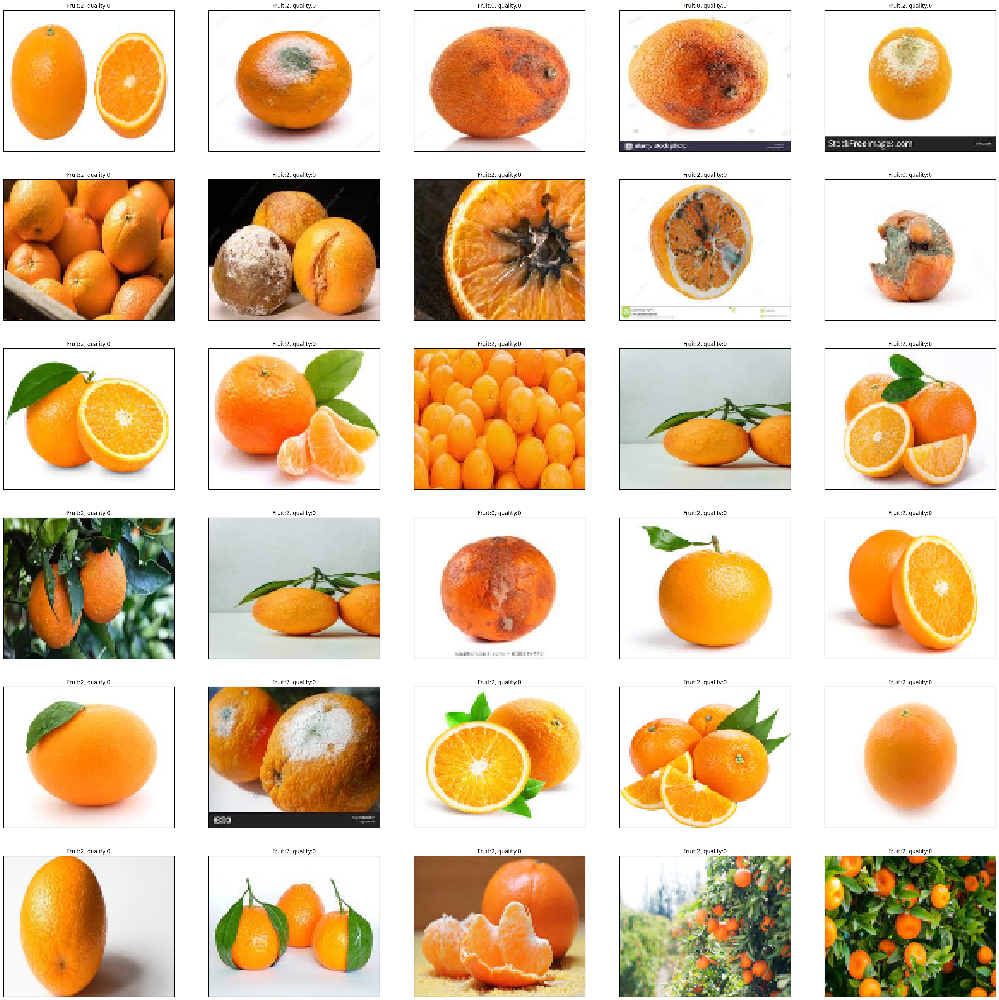

In [99]:
show_rand_pred(os.listdir('data/Fruit_category/orange')[:30],dir_='data/Fruit_category/orange', model=fruit_model, model_2=rotten_model)

1/1 [==============================] - 0s 58ms/step


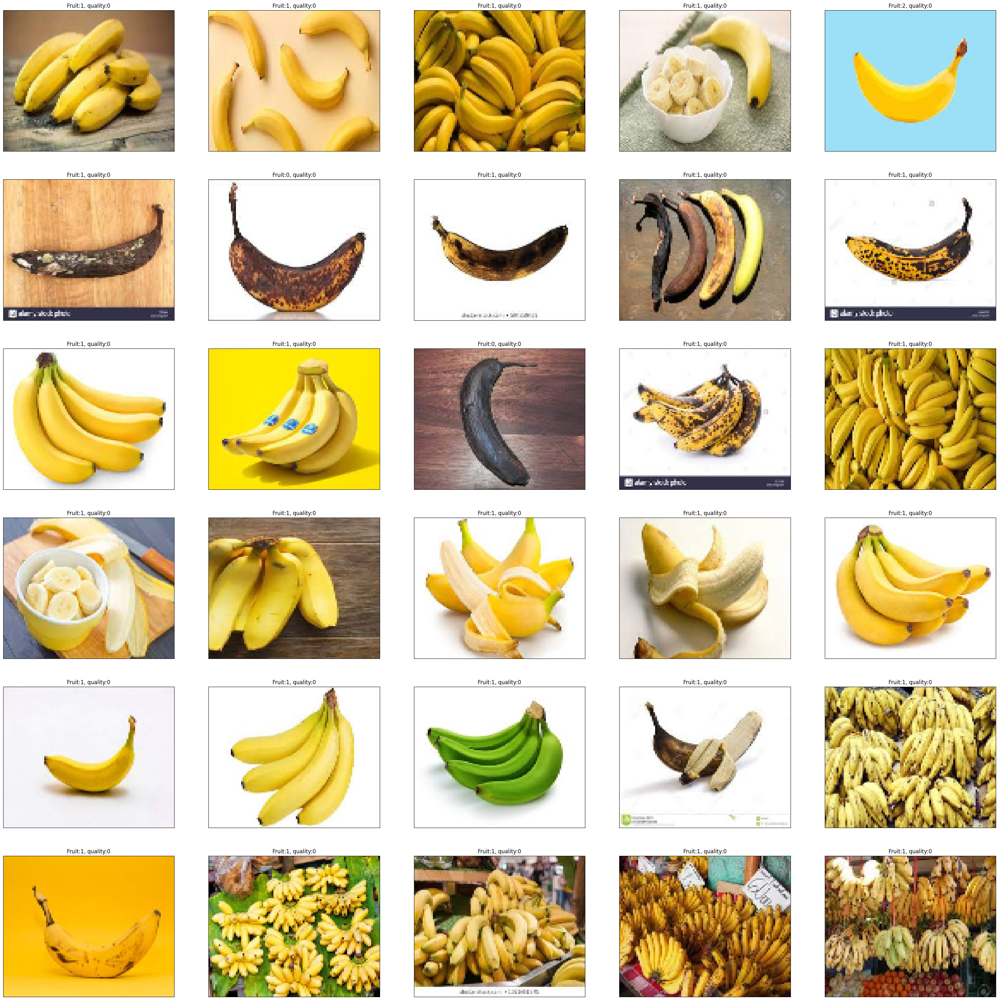

In [100]:
show_rand_pred(os.listdir('data/Fruit_category/banana')[:30],dir_='data/Fruit_category/banana', model=fruit_model, model_2=rotten_model)

In [101]:
## Quality Detection using a sample image

In [102]:
def upload_check(name,model_1=None,model_2=None):
    path=os.path.join(r'C:\Users\ABHIRAM NAIDU\Downloads',name)
    img=cv2.imread(path)
    img=cv2.resize(img,(100,100))
    img=cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(5,5))
    plt.title('Fruit:{}, Quality:{}'.format(np.argmax(model_1.predict(np.expand_dims(img,axis=0))),np.argmax(model_2.predict(np.expand_dims(img,axis=0)))))
    plt.imshow(img)

1/1 [==============================] - 0s 55ms/step


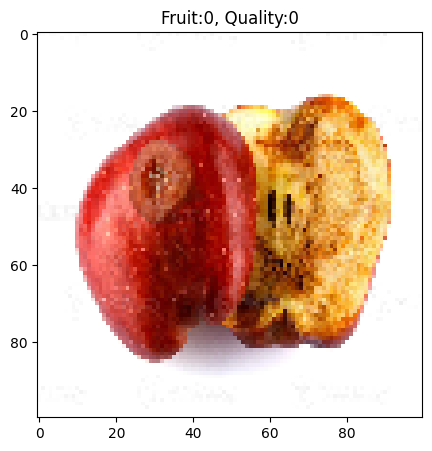

In [105]:
upload_check('photo.jpg',model_1=fruit_model,model_2=rotten_model)